# 02 VISIUM

## Notebook setup

In [1]:
import warnings
warnings.filterwarnings('ignore')

import scanpy as sc
import scanpy.external as sce
import numpy as np
import pandas as pd
import warnings, scipy.sparse as sp, matplotlib, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.pyplot import rc_context
from collections import Counter
import matplotlib.font_manager
import pyreadr
import rpy2
from rpy2.robjects.packages import importr
import rpy2.robjects as robjects
import magic
#import seaborn as sns
import palantir
import loompy
#from scipy.sparse import csgraph

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = 'Arial'
matplotlib.rc('font', size=14)

pd.set_option('display.max_rows', 200)

sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.settings.verbosity = 0 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.20.2 scipy==1.5.3 pandas==1.4.4 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


In [2]:
# preset color palettes and color maps
user_defined_palette =  [ '#F6222E', '#16FF32', '#3283FE', '#FEAF16', '#BDCDFF', '#3B00FB', '#1CFFCE', '#C075A6', '#F8A19F', '#B5EFB5', '#FBE426', '#C4451C', 
                          '#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', '#1CBE4F', '#1C8356', '#0e452b', '#AA0DFE', '#B5EFB5', '#325A9B', '#90AD1C']

user_defined_cmap_markers = LinearSegmentedColormap.from_list('mycmap', ["#E6E6FF", "#CCCCFF", "#B2B2FF", "#9999FF",  "#6666FF",   "#3333FF", "#0000FF"])
user_defined_cmap_degs = LinearSegmentedColormap.from_list('mycmap', ["#0000FF", "#3333FF", "#6666FF", "#9999FF", "#B2B2FF", "#CCCCFF", "#E6E6FF", "#E6FFE6", "#CCFFCC", "#B2FFB2", "#99FF99", "#66FF66", "#33FF33", "#00FF00"])

In [3]:
# display plot directly below code cell
%matplotlib inline

In [4]:
def observe_variance(anndata_object):
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    # variance per principal component
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = anndata_object.uns['pca']['variance_ratio']
    ax1.scatter(x,y,s=4)
    ax1.set_xlabel('PC')
    ax1.set_ylabel('Fraction of variance explained\n')
    ax1.set_title('Fraction of variance explained per PC\n')
    # cumulative variance explained
    cml_var_explained = np.cumsum(anndata_object.uns['pca']['variance_ratio'])
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = cml_var_explained
    ax2.scatter(x,y,s=4)
    ax2.set_xlabel('PC')
    ax2.set_ylabel('Cumulative fraction of variance\nexplained')
    ax2.set_title('Cumulative fraction of variance\nexplained by PCs')
    fig.tight_layout()
    plot = plt.show
    return(plot)

In [5]:
def label_transfer(dist, labels):
    lab = pd.get_dummies(labels).to_numpy().T
    class_prob = lab @ dist
    norm = np.linalg.norm(class_prob, 2, axis=0)
    class_prob = class_prob / norm
    class_prob = (class_prob.T - class_prob.min(1)) / class_prob.ptp(1)
    return class_prob

## Load spaceranger output files

(3010, 17617)
(3010, 17520)
(3010, 17520)


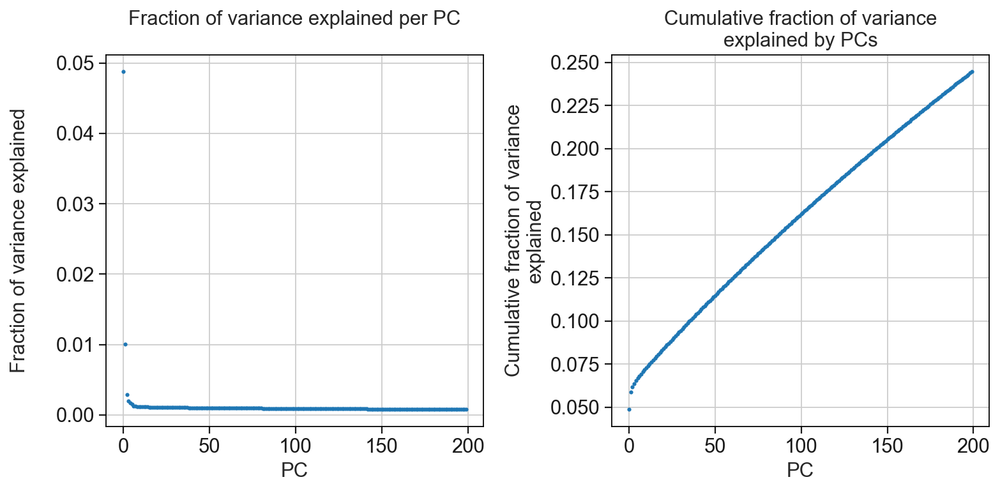

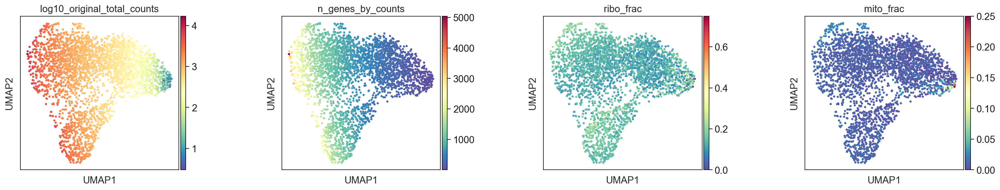

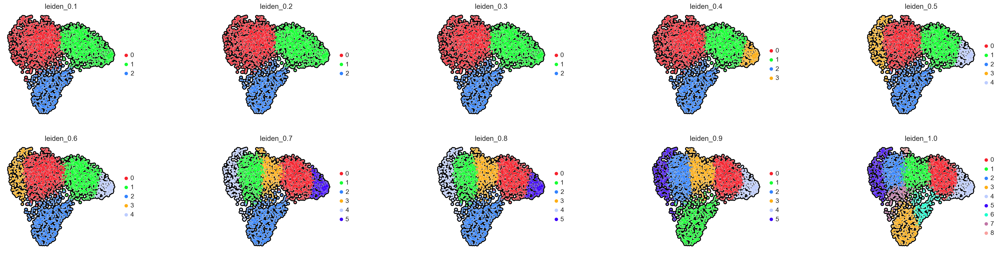

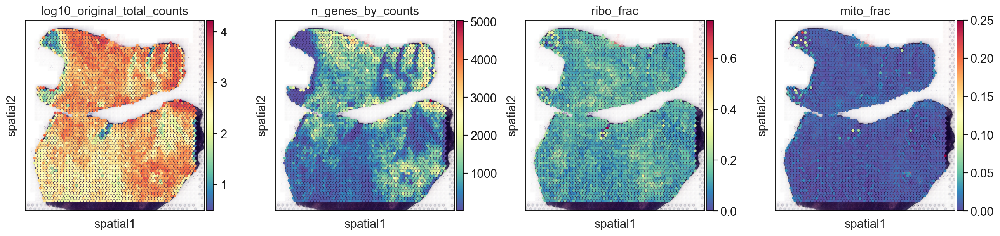

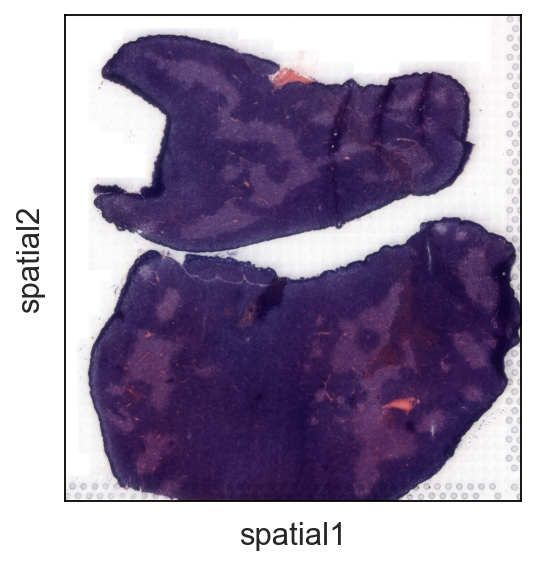

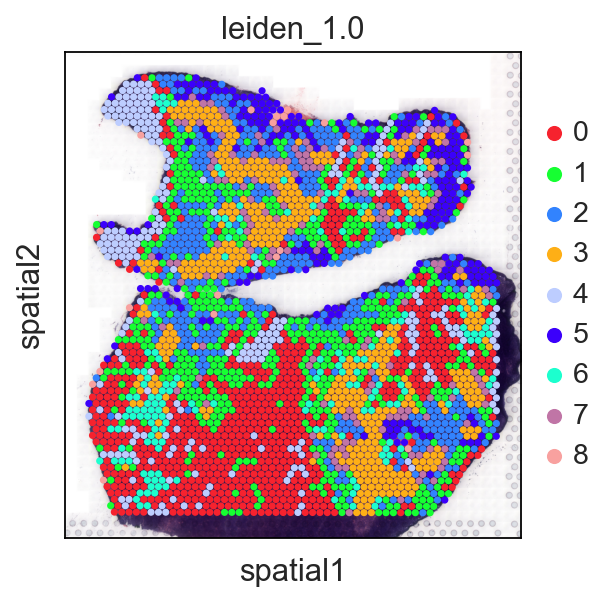

Total number of cells pre-filtering: 3010
Number of cells to keep after filtering: 2731


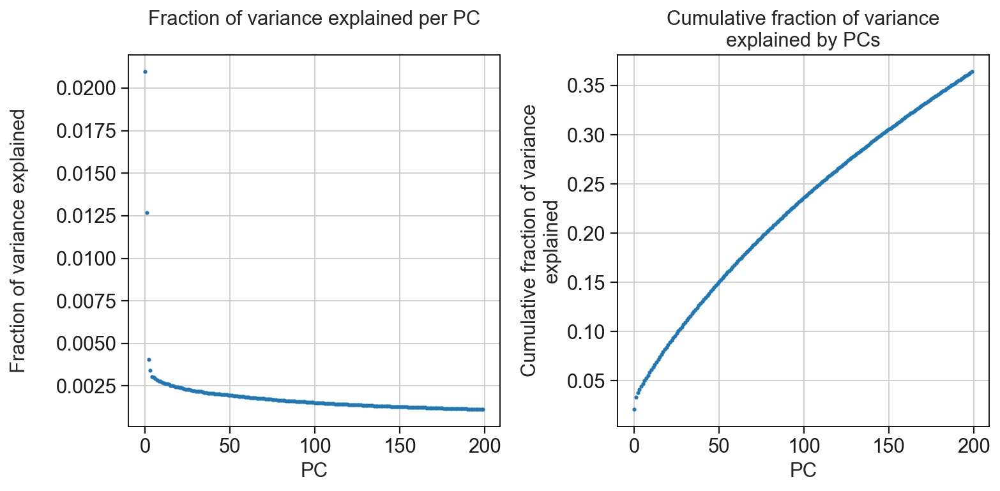

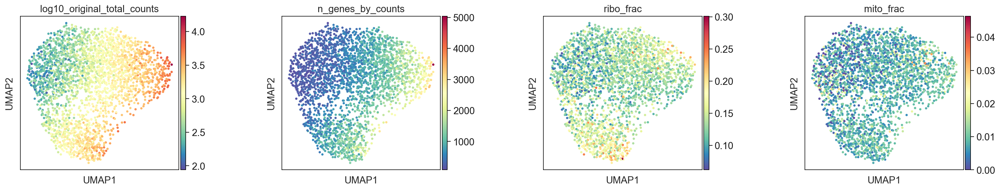

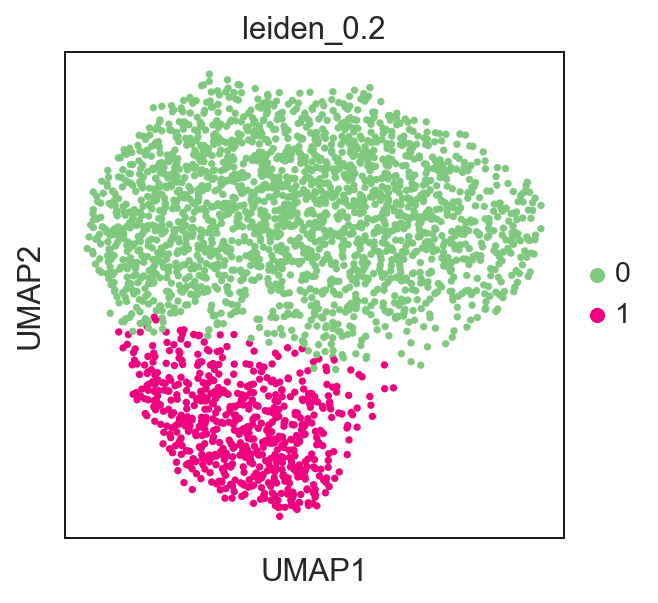

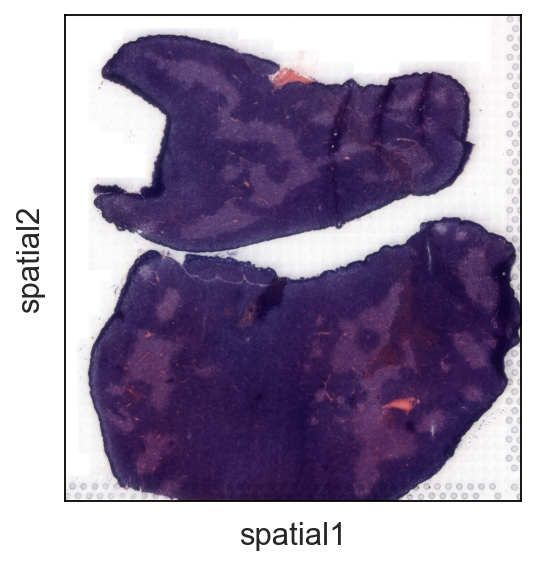

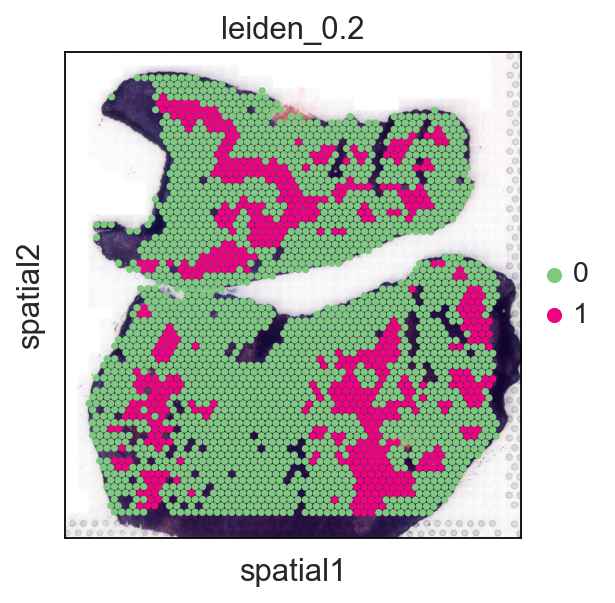

In [6]:
from glob import glob

counter=0
bad_clusters_per_sample = [['4', '8']]
visiums_list = []

h5_path = glob("../data/internal/10xGenomics/Visium/LJ184/LJ184_S_003/sr-results/", recursive = True)

for path in h5_path: 
    tmp_visium = sc.read_visium(path=path, count_file="filtered_feature_bc_matrix.h5", source_image_path=path)
    tmp_visium.var_names_make_unique()
    tmp_visium.raw = tmp_visium # keep a copy of the raw adata 
    
    np.random.seed(42) 
    index_list = np.arange(tmp_visium.shape[0]) # randomize the order of cells for plotting
    np.random.shuffle(index_list)
    tmp_visium = tmp_visium[index_list]
    
    sc.pp.calculate_qc_metrics(tmp_visium, inplace=True)
    tmp_visium.obs['original_total_counts'] = tmp_visium.obs['total_counts'] # store unfiltered/unprocessed data
    tmp_visium.obs['log10_original_total_counts'] = np.log10(tmp_visium.obs['original_total_counts']) # store unfiltered/unprocessed data 
 
    tmp_visium.var['mt'] = tmp_visium.var_names.str.startswith(('MT-', 'mt-')) # mitochondrial genes
    tmp_visium.var['ribo'] = tmp_visium.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl')) # ribosomal genes    
    tmp_visium.var['hb'] = tmp_visium.var_names.str.startswith(('^Hb', '^HB')) # hemoglobin genes

    tmp_visium.obs['mito_frac'] = np.sum(tmp_visium[:,tmp_visium.var['mt']==True].X, axis=1) / np.sum(tmp_visium.X, axis=1) # compute fraction of mitochondrial genes vs all genes per cell
    tmp_visium.obs['ribo_frac'] = np.sum(tmp_visium[:,tmp_visium.var['ribo']==True].X, axis=1) / np.sum(tmp_visium.X, axis=1) # compute fraction of ribosomal genes vs all genes per cell
    tmp_visium.obs['hb_frac'] = np.sum(tmp_visium[:,tmp_visium.var['hb']==True].X, axis=1) / np.sum(tmp_visium.X, axis=1) # compute fraction of hemoglobin genes vs all genes per cell

    sc.pp.filter_genes(tmp_visium, min_cells=1) # remove genes that are not expressed in any cells
    print(tmp_visium.shape)
    tmp_visium = tmp_visium[:,tmp_visium.var['ribo']==False] # remove ribosomal genes
    print(tmp_visium.shape)
    tmp_visium = tmp_visium[:,tmp_visium.var['hb']==False] # remove hemoglobin genes
    print(tmp_visium.shape)

    sc.pp.normalize_per_cell(tmp_visium, counts_per_cell_after=10**4)
    sc.pp.log1p(tmp_visium)

    sc.tl.pca(tmp_visium, n_comps=200, svd_solver='arpack', random_state=np.random.RandomState(42), use_highly_variable=False)
    observe_variance(tmp_visium)
    sc.tl.pca(tmp_visium, n_comps=30,  svd_solver='arpack', random_state=np.random.RandomState(42), use_highly_variable=False)
    sc.pp.neighbors(tmp_visium, n_neighbors=15, random_state=42)
    sc.tl.umap(tmp_visium)
    sc.pl.umap(tmp_visium, 
        color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
        palette='tab20',  
        color_map='Spectral_r', 
        ncols=4,
        wspace = 0.5,
        sort_order = False
    )
    
    for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
        sc.tl.leiden(tmp_visium, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))
    sc.pl.umap(tmp_visium, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.7,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
    )

    sc.pl.spatial(tmp_visium, 
              img_key="hires",
              color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
              size=1.5, 
              color_map='Spectral_r', 
              ncols=4)
    sc.pl.spatial(tmp_visium, 
              img_key="hires", 
              size=1.5, 
              color_map='Spectral_r', 
              ncols=4)
    
    sc.pl.spatial(tmp_visium, 
              img_key="hires", 
              color = ['leiden_1.0'], 
              size=1.5, 
              color_map='Spectral_r', 
              ncols=4)
    
    clusters_to_remove = bad_clusters_per_sample[counter]
    cluster_filter = [x not in clusters_to_remove for x in tmp_visium.obs['leiden_1.0']]
    print('Total number of cells pre-filtering: ' + str(tmp_visium.shape[0]))
    print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
    tmp_visium_filtered = tmp_visium[cluster_filter]
    tmp_visium = tmp_visium_filtered
    
    sc.pp.highly_variable_genes(tmp_visium, n_top_genes=5000, n_bins=20, flavor='seurat',  inplace=True)   
    sc.tl.pca(tmp_visium, n_comps=200, svd_solver='arpack', random_state=np.random.RandomState(42), use_highly_variable=True)
    observe_variance(tmp_visium)
    sc.tl.pca(tmp_visium, n_comps=30, svd_solver='arpack', random_state=np.random.RandomState(42), use_highly_variable=True)
    sc.pp.neighbors(tmp_visium, n_neighbors=15)
    sc.tl.umap(tmp_visium)
    sc.pl.umap(tmp_visium, 
        color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
        palette='tab20',  
        color_map='Spectral_r', 
        ncols=4,
        wspace = 0.5,
        sort_order = False
    )
    
    for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
        sc.tl.leiden(tmp_visium, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))    
        
    tmp_visium.uns['leiden_0.2_colors'] = ['#7fc97f', '#f0027f']
    sc.pl.umap(tmp_visium, 
        color=['leiden_0.2'], 
        color_map='Spectral_r', 
        ncols=4,
        wspace = 0.5,
        sort_order = False
    )
    
    sc.pl.spatial(tmp_visium, 
              img_key="hires", 
              size=1.5, 
              color_map='Spectral_r', 
              ncols=4)

    sc.pl.spatial(tmp_visium, 
                  img_key="hires", 
                  color = ['leiden_0.2'], 
                  palette=['#7fc97f', '#f0027f'],
                  color_map='Spectral_r', 
                  size=1.5, 
                  ncols=4)
    path_to_h5ad = '../output/anndata_io/Fig2d-02mo.h5ad'
    tmp_visium.write(path_to_h5ad)
    visiums_list.append(tmp_visium)
    counter = counter + 1

(1392, 17016)
(1392, 16920)
(1392, 16920)


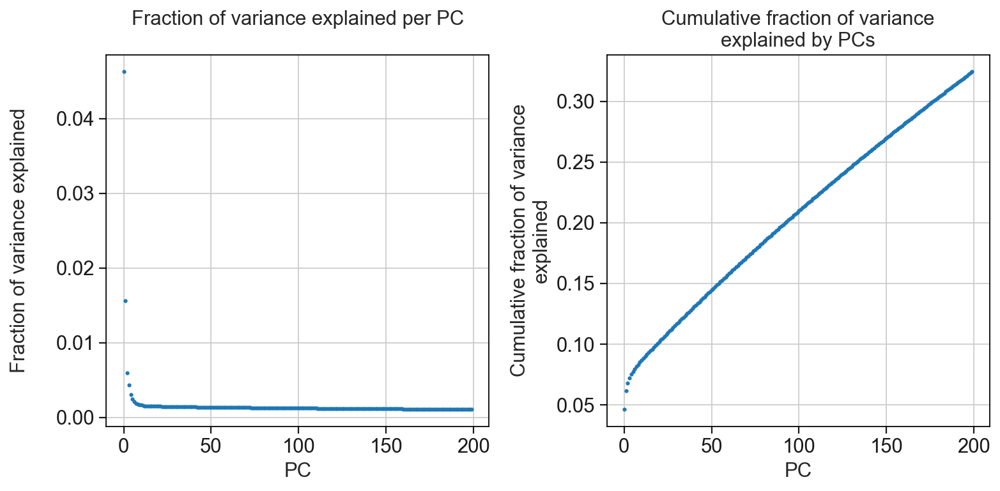

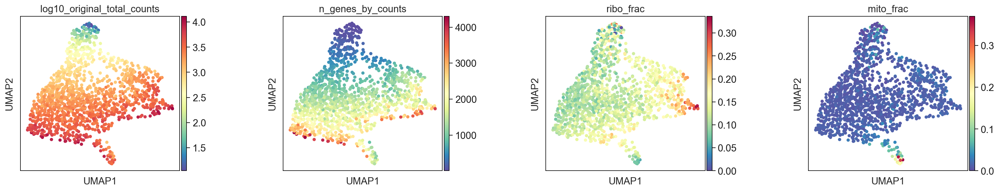

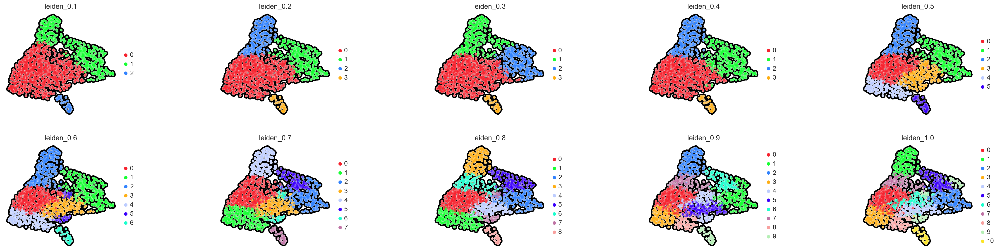

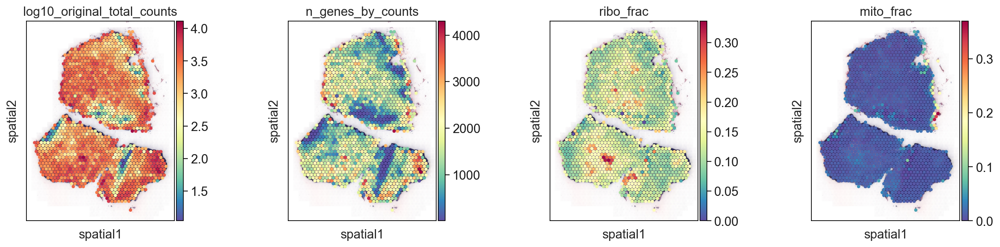

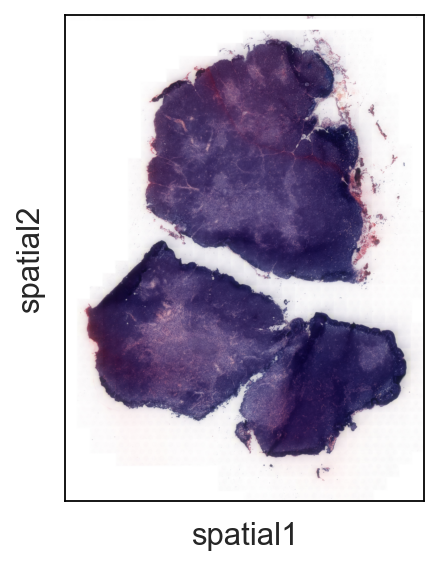

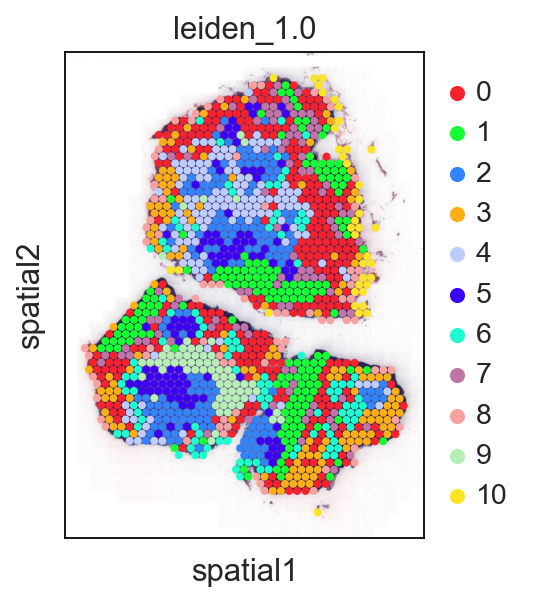

Total number of cells pre-filtering: 1392
Number of cells to keep after filtering: 1179


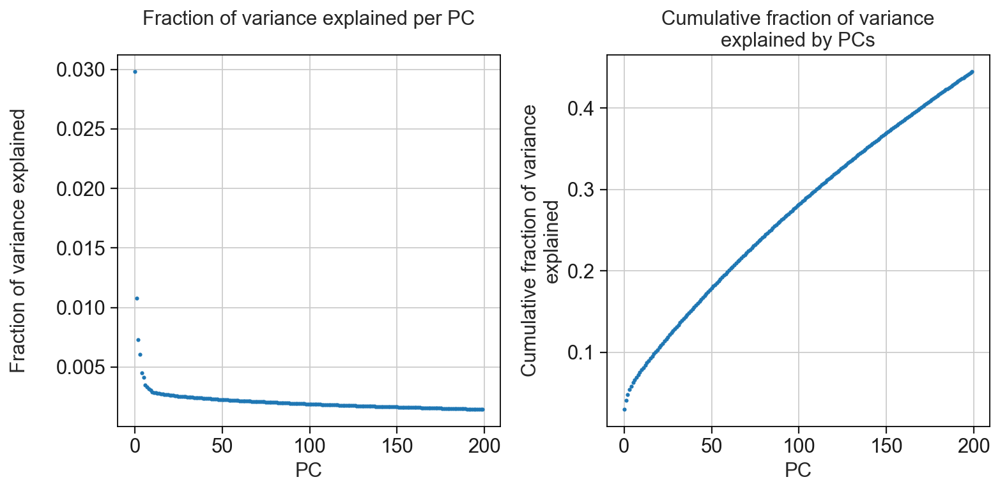

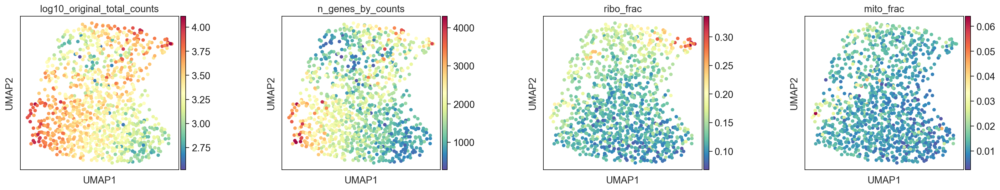

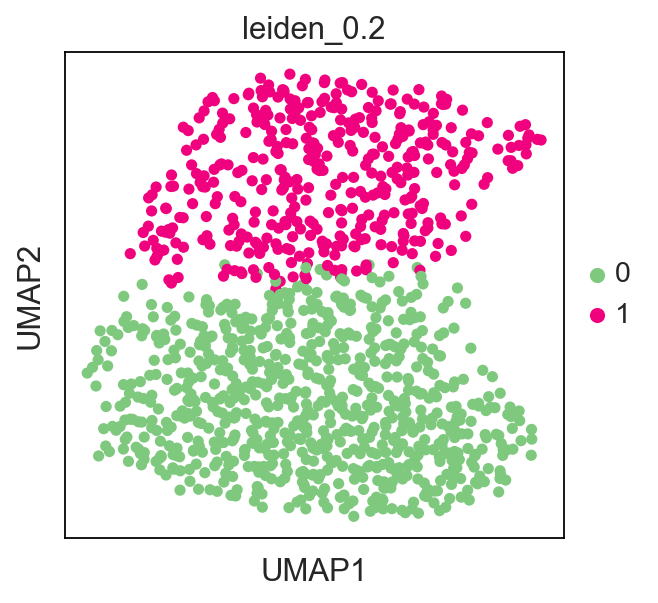

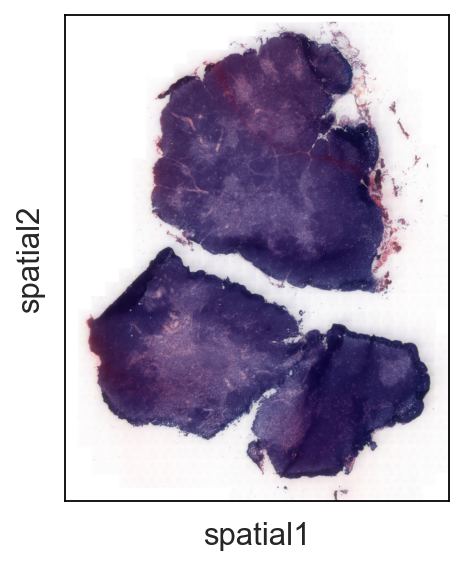

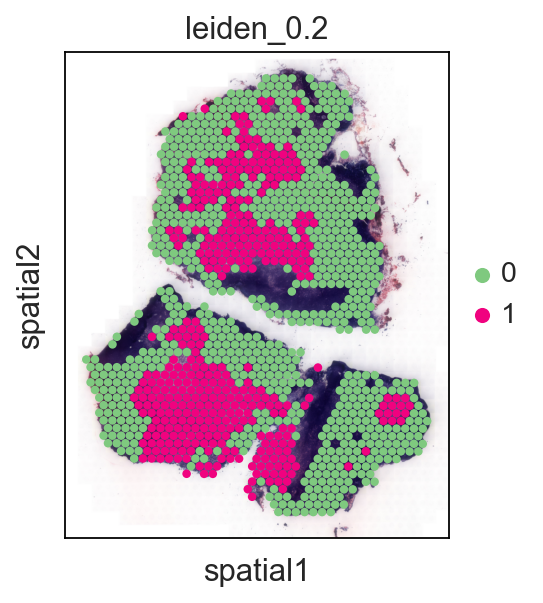

In [7]:
from glob import glob

counter=0
bad_clusters_per_sample = [['1', '10']]

h5_path = glob("../data/internal/10xGenomics/Visium/LJ184/LJ184_S_019/sr-results/", recursive = True)

for path in h5_path: 
    tmp_visium = sc.read_visium(path=path, count_file="filtered_feature_bc_matrix.h5", source_image_path=path)
    tmp_visium.var_names_make_unique()
    tmp_visium.raw = tmp_visium # keep a copy of the raw adata 
    
    np.random.seed(42) 
    index_list = np.arange(tmp_visium.shape[0]) # randomize the order of cells for plotting
    np.random.shuffle(index_list)
    tmp_visium = tmp_visium[index_list]
    
    sc.pp.calculate_qc_metrics(tmp_visium, inplace=True)
    tmp_visium.obs['original_total_counts'] = tmp_visium.obs['total_counts'] # store unfiltered/unprocessed data
    tmp_visium.obs['log10_original_total_counts'] = np.log10(tmp_visium.obs['original_total_counts']) # store unfiltered/unprocessed data 
 
    tmp_visium.var['mt'] = tmp_visium.var_names.str.startswith(('MT-', 'mt-')) # mitochondrial genes
    tmp_visium.var['ribo'] = tmp_visium.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl')) # ribosomal genes    
    tmp_visium.var['hb'] = tmp_visium.var_names.str.startswith(('^Hb', '^HB')) # hemoglobin genes

    tmp_visium.obs['mito_frac'] = np.sum(tmp_visium[:,tmp_visium.var['mt']==True].X, axis=1) / np.sum(tmp_visium.X, axis=1) # compute fraction of mitochondrial genes vs all genes per cell
    tmp_visium.obs['ribo_frac'] = np.sum(tmp_visium[:,tmp_visium.var['ribo']==True].X, axis=1) / np.sum(tmp_visium.X, axis=1) # compute fraction of ribosomal genes vs all genes per cell
    tmp_visium.obs['hb_frac'] = np.sum(tmp_visium[:,tmp_visium.var['hb']==True].X, axis=1) / np.sum(tmp_visium.X, axis=1) # compute fraction of hemoglobin genes vs all genes per cell

    sc.pp.filter_genes(tmp_visium, min_cells=1) # remove genes that are not expressed in any cells
    print(tmp_visium.shape)
    tmp_visium = tmp_visium[:,tmp_visium.var['ribo']==False] # remove ribosomal genes
    print(tmp_visium.shape)
    tmp_visium = tmp_visium[:,tmp_visium.var['hb']==False] # remove hemoglobin genes
    print(tmp_visium.shape)

    sc.pp.normalize_per_cell(tmp_visium, counts_per_cell_after=10**4)
    sc.pp.log1p(tmp_visium)

    sc.tl.pca(tmp_visium, n_comps=200, svd_solver='arpack', random_state=np.random.RandomState(42), use_highly_variable=False)
    observe_variance(tmp_visium)
    sc.tl.pca(tmp_visium, n_comps=30,  svd_solver='arpack', random_state=np.random.RandomState(42), use_highly_variable=False)
    sc.pp.neighbors(tmp_visium, n_neighbors=15, random_state=42)
    sc.tl.umap(tmp_visium)
    sc.pl.umap(tmp_visium, 
        color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
        palette='tab20',  
        color_map='Spectral_r', 
        ncols=4,
        wspace = 0.5,
        sort_order = False
    )
    
    for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
        sc.tl.leiden(tmp_visium, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))
    sc.pl.umap(tmp_visium, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.7,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
    )

    sc.pl.spatial(tmp_visium, 
              img_key="hires",
              color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
              size=1.5, 
              color_map='Spectral_r', 
              ncols=4)
    sc.pl.spatial(tmp_visium, 
              img_key="hires", 
              size=1.5, 
              color_map='Spectral_r', 
              ncols=4)
    
    sc.pl.spatial(tmp_visium, 
              img_key="hires", 
              color = ['leiden_1.0'], 
              size=1.5, 
              color_map='Spectral_r', 
              ncols=4)
    
    clusters_to_remove = bad_clusters_per_sample[counter]
    cluster_filter = [x not in clusters_to_remove for x in tmp_visium.obs['leiden_1.0']]
    print('Total number of cells pre-filtering: ' + str(tmp_visium.shape[0]))
    print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
    tmp_visium_filtered = tmp_visium[cluster_filter]
    tmp_visium = tmp_visium_filtered
    
    sc.pp.highly_variable_genes(tmp_visium, n_top_genes=5000, n_bins=20, flavor='seurat',  inplace=True)   
    sc.tl.pca(tmp_visium, n_comps=200, svd_solver='arpack', random_state=np.random.RandomState(42), use_highly_variable=True)
    observe_variance(tmp_visium)
    sc.tl.pca(tmp_visium, n_comps=30, svd_solver='arpack', random_state=np.random.RandomState(42), use_highly_variable=True)
    sc.pp.neighbors(tmp_visium, n_neighbors=15)
    sc.tl.umap(tmp_visium)
    sc.pl.umap(tmp_visium, 
        color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
        palette='tab20',  
        color_map='Spectral_r', 
        ncols=4,
        wspace = 0.5,
        sort_order = False
    )
    
    for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
        sc.tl.leiden(tmp_visium, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))    
        
    tmp_visium.uns['leiden_0.2_colors'] = ['#7fc97f', '#f0027f']
    sc.pl.umap(tmp_visium, 
        color=['leiden_0.2'], 
        color_map='Spectral_r', 
        ncols=4,
        wspace = 0.5,
        sort_order = False
    )
    
    sc.pl.spatial(tmp_visium, 
              img_key="hires", 
              size=1.5, 
              color_map='Spectral_r', 
              ncols=4)

    sc.pl.spatial(tmp_visium, 
                  img_key="hires", 
                  color = ['leiden_0.2'], 
                  palette=['#7fc97f', '#f0027f'],
                  color_map='Spectral_r', 
                  size=1.5, 
                  ncols=4)
    path_to_h5ad = '../output/anndata_io/Fig2d-18mo.h5ad'
    tmp_visium.write(path_to_h5ad)
    visiums_list.append(tmp_visium)
    counter = counter + 1

## Scanorama spatial-RNAseq integration

In [8]:
import scanorama
import numpy as np

In [9]:
path_to_h5ad = '../output/anndata_io/Fig1af.h5ad'

In [10]:
adata_d0 = sc.read_h5ad(path_to_h5ad)
adata_d0.uns['log1p']["base"] = None

In [11]:
adata_d0_02mo = adata_d0[adata_d0.obs['stage']=='02mo']

In [12]:
adata_d0_02mo.shape

(10962, 27657)

In [13]:
adata_d0_18mo = adata_d0[adata_d0.obs['stage']=='18mo']

In [14]:
adata_d0_18mo.shape

(11970, 27657)

## Steady state 2mo

In [15]:
# List of datasets:
adatas = [adata_d0_02mo, visiums_list[0]]

# Integration. 
scanorama.integrate_scanpy(adatas)

Found 17441 genes among all datasets
[[0.         0.20212376]
 [0.         0.        ]]
Processing datasets (0, 1)


In [16]:
adatas[0].obsm['X_scanorama'].shape

(10962, 100)

In [17]:
total = adata_d0_02mo.concatenate(
    visiums_list[0],
    batch_key="dataset",
    batch_categories=["10x_Chromium", "10x_Visium"],
    join="outer",
    uns_merge="first",
)

In [18]:
# Get all the integrated matrices.
scanorama_int = [ad.obsm['X_scanorama'] for ad in adatas]

# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

# add to the AnnData object
total.obsm["scanorama_embedding"] = all_s

(13693, 100)


In [19]:
from sklearn.metrics.pairwise import cosine_distances

distances = 1 - cosine_distances(
    total[total.obs.dataset == "10x_Chromium"].obsm[
        "scanorama_embedding"
    ],
    total[total.obs.dataset == "10x_Visium"].obsm[
        "scanorama_embedding"
    ],
)

In [20]:
class_prob = label_transfer(distances, adata_d0_02mo.obs.cell_type_subset)

In [21]:
cp_df = pd.DataFrame(
    class_prob, columns=np.sort(adata_d0_02mo.obs.cell_type_subset.unique())
)

cp_df.index =  visiums_list[0].obs.index

In [22]:
adata_transfer =  visiums_list[0].copy()
adata_transfer.obs = pd.concat(
    [ visiums_list[0].obs, cp_df], axis=1
)

In [23]:
adata_transfer_02mo = adata_transfer 

## Steady state 18mo

In [24]:
# List of datasets:
adatas = [adata_d0_18mo, visiums_list[1]]

# Integration. 
scanorama.integrate_scanpy(adatas)

Found 16864 genes among all datasets
[[0.         0.32994063]
 [0.         0.        ]]
Processing datasets (0, 1)


In [25]:
adatas[0].obsm['X_scanorama'].shape

(11970, 100)

In [26]:
del total

In [27]:
total = adata_d0_18mo.concatenate(
    visiums_list[1],
    batch_key="dataset",
    batch_categories=["10x_Chromium", "10x_Visium"],
    join="outer",
    uns_merge="first",
)

In [28]:
# Get all the integrated matrices.
scanorama_int = [ad.obsm['X_scanorama'] for ad in adatas]

# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

# add to the AnnData object
total.obsm["scanorama_embedding"] = all_s

(13149, 100)


In [29]:
from sklearn.metrics.pairwise import cosine_distances

distances = 1 - cosine_distances(
    total[total.obs.dataset == "10x_Chromium"].obsm[
        "scanorama_embedding"
    ],
    total[total.obs.dataset == "10x_Visium"].obsm[
        "scanorama_embedding"
    ],
)

In [30]:
class_prob = label_transfer(distances, adata_d0_18mo.obs.cell_type_subset)

In [31]:
cp_df = pd.DataFrame(
    class_prob, columns=np.sort(adata_d0_18mo.obs.cell_type_subset.unique())
)

cp_df.index =  visiums_list[1].obs.index

In [32]:
adata_transfer =  visiums_list[1].copy()
adata_transfer.obs = pd.concat(
    [ visiums_list[1].obs, cp_df], axis=1
)

In [33]:
adata_transfer_18mo = adata_transfer

## aaTEC1 and aaTEC2 signatures mapped to the visium data

In [34]:
aaTEC1_sign = ['Zbtb20',	'Cd81',	'Trpm3',	'Gstm1',	'Slc16a11',	'Btg1',	'BC006965',	'Cldn3',	'Gsta4',	'S100a11',	'Ly6e',	'Cdk19',	'Slc9a3r1',	'Ifi27l2a',	'Aldoc',	'Wfdc18',	'Phlda1',	'Fam107a',	'Gsn',	'Anxa2']
aaTEC2_sign = ['Csmd1',	'Zeb2',	'Mgp',	'Gsn',	'Zbtb20',	'Ndrg2',	'Serpine2',	'Cd81',	'Fxyd1',	'Laptm4a',	'Gpx3',	'Socs3',	'Igfbp7',	'Airn',	'Lgals1',	'Fos',	'Prrx1',	'Prkg1',	'Sparc',	'Junb']

In [35]:
x=19
sc.tl.score_genes(adata_transfer_02mo, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign')
sc.tl.score_genes(adata_transfer_02mo, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign')

In [36]:
x=19
sc.tl.score_genes(adata_transfer_18mo, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign')
sc.tl.score_genes(adata_transfer_18mo, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign')

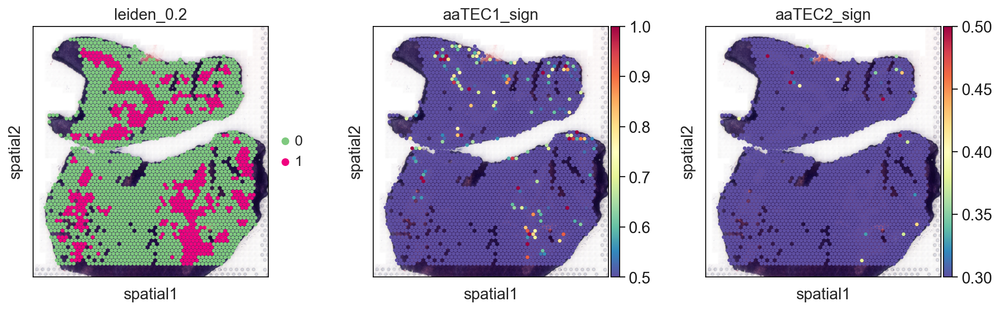

In [37]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

for library in ["LJ184_S_003"]:
    sc.pl.spatial(adata_transfer_02mo, library_id=library, 
                  img_key="hires",
                  color = ['leiden_0.2', 'aaTEC1_sign', 'aaTEC2_sign'],
                  size=1.5,
                  use_raw=False,
                  color_map='Spectral_r', 
                  ncols=6,
                  vmax=[0, 1, 0.5],
                  vmin=[0, 0.5, 0.3]
    )

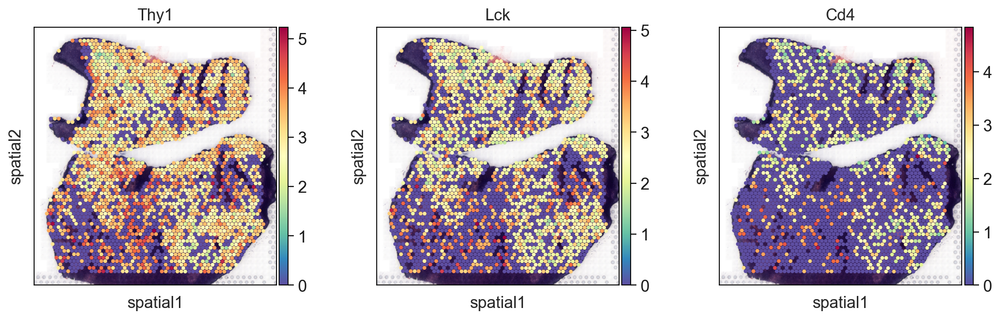

In [38]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

for library in ["LJ184_S_003"]:
    sc.pl.spatial(adata_transfer_02mo, library_id=library, 
                  img_key="hires",
                  color = ['Thy1', 'Lck', 'Cd4'],
                  size=1.5,
                  use_raw=False,
                  color_map='Spectral_r', 
                  ncols=6
    )

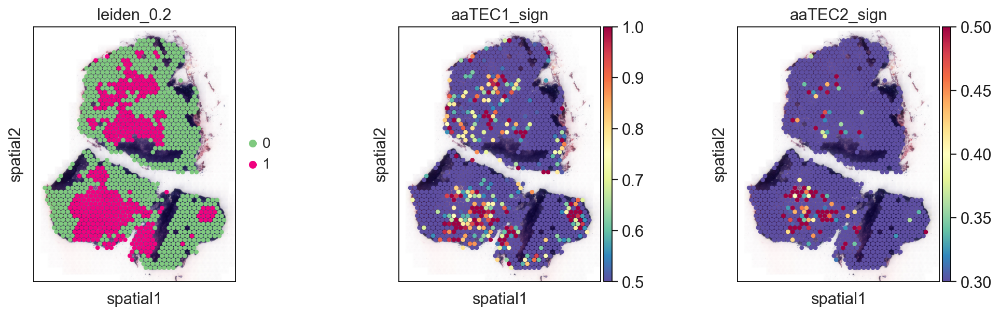

In [39]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

for library in ["LJ184_S_019"]:
    sc.pl.spatial(adata_transfer_18mo, library_id=library, 
                  img_key="hires",
                  color = ['leiden_0.2', 'aaTEC1_sign', 'aaTEC2_sign'],
                  size=1.5,
                  use_raw=False,
                  color_map='Spectral_r', 
                  ncols=6,
                  vmax=[0, 1, 0.5],
                  vmin=[0, 0.5, 0.3]
    )

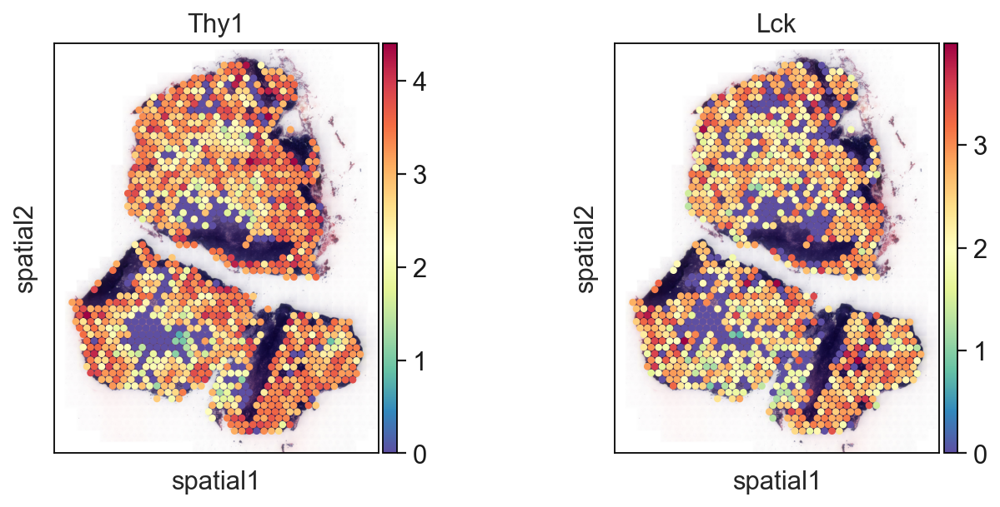

In [40]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

for library in ["LJ184_S_019"]:
    sc.pl.spatial(adata_transfer_18mo, library_id=library, 
                  img_key="hires",
                  color = ['Thy1', 'Lck'],
                  size=1.5,
                  use_raw=False,
                  color_map='Spectral_r', 
                  ncols=6
    )